# Load Required Libraries

In [1]:
import pandas as pd
import numpy as np
import os  # For file path operations
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score, recall_score, cohen_kappa_score, precision_score, f1_score

import warnings
warnings.filterwarnings("ignore")

# Load datasets Function

In [2]:
# Function to load a CSV file
def list_files_in_directory(directory: str) -> list:
    """
    Recursively lists all files in the specified directory.

    Args:
        directory (str): Path to the directory to be scanned.

    Returns:
        list: List of file paths in the directory.
    """
    file_paths = []
    for dirname, _, filenames in os.walk(directory):  # Traverse the directory tree
        for filename in filenames:  # Collect all file names
            file_paths.append(os.path.join(dirname, filename))  # Get full file path
    return file_paths

# Get the current working directory
current_path = os.getcwd()

# Define the path to the directory you want to scan
input_directory = current_path+'\\Dataset'

# Call the function to get all file paths from input directory
files = list_files_in_directory(input_directory)

# Display the list of files
for file in files:
    print(file)

C:\Users\malav\Downloads\DMMLFinal\Dataset\Asia Africa Europ Energy Consumption.csv
C:\Users\malav\Downloads\DMMLFinal\Dataset\fakenews.csv
C:\Users\malav\Downloads\DMMLFinal\Dataset\hotel_booking.csv


In [3]:
# Function to load a CSV file
def load_csv_file(file_path: str, separator: str = ',') -> pd.DataFrame:
    """
    Load a CSV file into a pandas DataFrame.

    Args:
        file_path (str): Path to the CSV file.
        separator (str): Delimiter used in the CSV file (default is ',').

    Returns:
        pd.DataFrame: DataFrame containing the loaded data.
    """
    try:
        # Read the CSV file and return as DataFrame
        return pd.read_csv(file_path, sep=separator)
    except FileNotFoundError:
        print(f"Error: File not found at {file_path}")
        return pd.DataFrame()  # Return an empty DataFrame if file not foundtrainning_file_path = input_directory + "\\train.csv"

In [4]:
# Function to Analyze Data frame dataset and identify missing details
def analyze_dataframe(df: pd.DataFrame):
    """
    Perform a comprehensive analysis of a DataFrame and display key information.

    Args:
        df (pd.DataFrame): The DataFrame to analyze.

    Outputs:
        - Shape of the DataFrame (rows, columns).
        - Data types of each column.
        - Value counts for each column.
        - Number of unique values in each column.
        - Details of a specific column: 'Unnamed: 0' (if it exists).
        - Details of a specific column: 'label' (if it exists), including value counts.
        - Count of missing values (NaNs) in each column.
    """
    # Display the shape of the DataFrame
    print("Shape of the DataFrame (rows, columns):")
    print(df.shape)
    print("-" * 50)

    # Display data types of each column
    print("Data types of each column:")
    print(df.dtypes)
    print("-" * 50)

    # Display value counts for each column
    print("Value counts for each column:")
    for column in df.columns:
        print(f"Column: {column}")
        print(df[column].value_counts())
        print("-" * 50)

    # Display the number of unique values in each column
    print("Number of unique values in each column:")
    print(df.nunique())
    print("-" * 50)

    # Check if the column 'Unnamed: 0' exists, and display it if present
    if 'Unnamed: 0' in df.columns:
        print("Contents of the 'Unnamed: 0' column:")
        print(df['Unnamed: 0'])
        print("-" * 50)

    # Check if the column 'label' exists, and display its details if present
    if 'label' in df.columns:
        print("Contents of the 'label' column:")
        print(df['label'])
        print("Value counts of the 'label' column:")
        print(df['label'].value_counts())
        print("-" * 50)

    # Display the count of missing values (NaNs) in each column
    print("Count of missing values (NaNs) in each column:")
    print(df.isna().sum())
    print("-" * 50)

## 1. Load Hotel Booking Dataset

In [5]:
# Location of Train data csv 
hotel_data_file_path = input_directory + "\\hotel_booking.csv"

# Load data from input directory
hotel_ds = load_csv_file(hotel_data_file_path, separator=',')

display(hotel_ds.head())  # Display the first few rows in a notebook-friendly format

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,Transient,0.0,0,0,Check-Out,2015-07-01,Ernest Barnes,Ernest.Barnes31@outlook.com,669-792-1661,************4322
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,Transient,0.0,0,0,Check-Out,2015-07-01,Andrea Baker,Andrea_Baker94@aol.com,858-637-6955,************9157
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,Transient,75.0,0,0,Check-Out,2015-07-02,Rebecca Parker,Rebecca_Parker@comcast.net,652-885-2745,************3734
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,Transient,75.0,0,0,Check-Out,2015-07-02,Laura Murray,Laura_M@gmail.com,364-656-8427,************5677
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,Transient,98.0,0,1,Check-Out,2015-07-03,Linda Hines,LHines@verizon.com,713-226-5883,************5498


### Exploratory Data Analysis (EDA) for Hotel Bookings

In [6]:
print("\nHotel Bookings Dataset Overview:")
print(hotel_ds.info())


Hotel Bookings Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 36 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-n

In [7]:
# usage with a DataFrame named 'df'
analyze_dataframe(hotel_ds)

Shape of the DataFrame (rows, columns):
(119390, 36)
--------------------------------------------------
Data types of each column:
hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type           

## 2. Load Classifying Fake News Dataset

In [8]:
# Location of Train data csv 
fakenews_file_path = input_directory + "\\fakenews.csv"

# Load data from input directory
fakenews_ds = load_csv_file(fakenews_file_path, separator=';')

display(fakenews_ds.head())  # Display the first few rows in a notebook-friendly format

,Unnamed: 0,title,text,label
0,0,Palestinians switch off Christmas lights in Be...,"RAMALLAH, West Bank (Reuters) - Palestinians s...",1
1,1,China says Trump call with Taiwan president wo...,BEIJING (Reuters) - U.S. President-elect Donal...,1
2,2,FAIL! The Trump Organization’s Credit Score W...,While the controversy over Trump s personal ta...,0
3,3,Zimbabwe military chief's China trip was norma...,BEIJING (Reuters) - A trip to Beijing last wee...,1
4,4,THE MOST UNCOURAGEOUS PRESIDENT EVER Receives ...,There has never been a more UNCOURAGEOUS perso...,0


### Exploratory Data Analysis (EDA) for Clasifying Fake News

In [9]:
print("\nClassifying Fake News Dataset Overview:")
print(fakenews_ds.info())


Classifying Fake News Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24353 entries, 0 to 24352
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  24353 non-null  int64 
 1   title       24353 non-null  object
 2   text        24353 non-null  object
 3   label       24353 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 761.2+ KB
None


In [10]:
# usage with a DataFrame named 'df'
analyze_dataframe(fakenews_ds)

Shape of the DataFrame (rows, columns):
(24353, 4)
--------------------------------------------------
Data types of each column:
Unnamed: 0     int64
title         object
text          object
label          int64
dtype: object
--------------------------------------------------
Value counts for each column:
Column: Unnamed: 0
0        1
16232    1
16241    1
16240    1
16239    1
        ..
8116     1
8115     1
8114     1
8113     1
24352    1
Name: Unnamed: 0, Length: 24353, dtype: int64
--------------------------------------------------
Column: title
no title                                                                                                                                          105
Factbox: Trump fills top jobs for his administration                                                                                               10
newsticker                                                                                                                                   

## 3. Load Energy Consumption Dataset

In [11]:
# Location of Train data csv 
trainning_file_path = input_directory + "\\Asia Africa Europ Energy Consumption.csv"

# Load data from input directory
energy_ds = load_csv_file(trainning_file_path, separator=',')

energy_ds.head # Display the first few rows in a notebook-friendly format

<bound method NDFrame.head of            country  year iso_code  population           gdp  \
0      Afghanistan  1921      AFG    10162753           NaN   
1      Afghanistan  1922      AFG     9893152           NaN   
2      Afghanistan  1923      AFG     9374030           NaN   
3      Afghanistan  1924      AFG     8882148           NaN   
4      Afghanistan  1925      AFG     8416077           NaN   
...            ...   ...      ...         ...           ...   
13046     Zimbabwe  2018      ZWE    15052191  2.271535e+10   
13047     Zimbabwe  2019      ZWE    15354606           NaN   
13048     Zimbabwe  2020      ZWE    15669663           NaN   
13049     Zimbabwe  2021      ZWE    15993525           NaN   
13050     Zimbabwe  2022      ZWE    16320539           NaN   

       biofuel_cons_change_pct  biofuel_cons_change_twh  \
0                          NaN                      NaN   
1                          NaN                      NaN   
2                          NaN      

### Exploratory Data Analysis (EDA) for Energy Consumption

In [12]:
print("\nEnergy Consumption Dataset Overview:")
print(energy_ds.info())


Energy Consumption Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13051 entries, 0 to 13050
Columns: 118 entries, country to wind_share_energy
dtypes: float64(114), int64(2), object(2)
memory usage: 11.7+ MB
None


In [13]:
# usage with a DataFrame named 'df'
analyze_dataframe(energy_ds)

Shape of the DataFrame (rows, columns):
(13051, 118)
--------------------------------------------------
Data types of each column:
country                    object
year                        int64
iso_code                   object
population                  int64
gdp                       float64
                           ...   
wind_elec_per_capita      float64
wind_electricity          float64
wind_energy_per_capita    float64
wind_share_elec           float64
wind_share_energy         float64
Length: 118, dtype: object
--------------------------------------------------
Value counts for each column:
Column: country
Zimbabwe                102
Poland                  102
Colombia                102
Congo                   102
Peru                    102
                       ... 
Palestine                25
East Timor               19
Montenegro               18
Netherlands Antilles     13
South Sudan              11
Name: country, Length: 199, dtype: int64
----------------------

-----

# Data Visualization

## 1. Hotel Booking Dataset Data Visualization

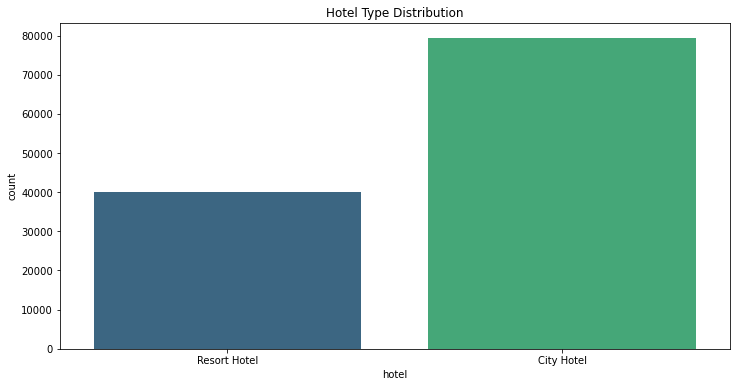

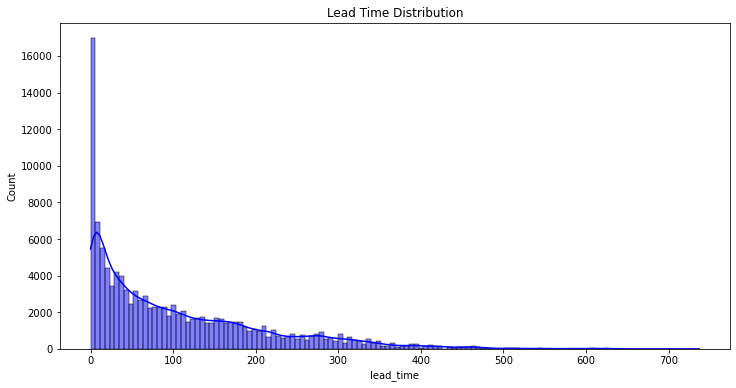

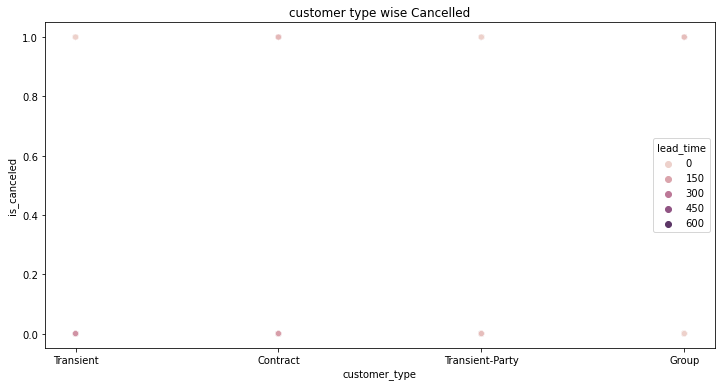

In [14]:
def plot_hotel_eda(data):
    plt.figure(figsize=(12, 6))
    sns.countplot(data['hotel'], palette='viridis')
    plt.title('Hotel Type Distribution')
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.histplot(data['lead_time'], kde=True, color='blue')
    plt.title('Lead Time Distribution')
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.scatterplot(x='customer_type', y='is_canceled', hue='lead_time', data=data)
    plt.title('customer type wise Cancelled')
    plt.show()

plot_hotel_eda(hotel_ds)

## 2. Fake News Dataset Data Visualization

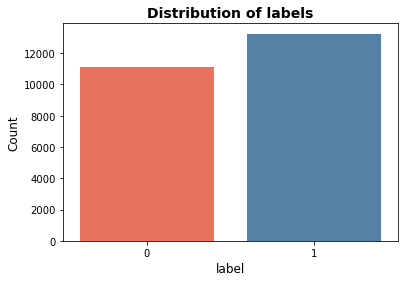

In [15]:
#import seaborn as sns
#import matplotlib.pyplot as plt
import warnings

# Suppress all FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)
# Function to plot labelling and distribution of Data frame dataset
def plot_label_distribution(df: pd.DataFrame, xcolumn: str, ycolumn: str = 'Count' , title: str = 'Distribution of labels'):
    """
    Plot the distribution of a categorical column using a countplot.

    Args:
        df (pd.DataFrame): The DataFrame containing the data.
        column (str): The name of the column to plot.
        title (str): The title for the plot. Default is 'Distribution of labels'.

    Outputs:
        A countplot showing the distribution of values in the specified column.
    """
    # Check if the specified column exists in the DataFrame
    bar_colors=['#FF6347', '#4682B4', '#32CD32']
    if xcolumn in df.columns:
        # Create a countplot to visualize the distribution of the column
        # Pass the 'column' to the hue parameter and set legend=False
        sns.countplot(data=df, x=xcolumn, palette=bar_colors)
        
        # Add a title and axis labels for clarity
        plt.title(title, fontsize=14, fontweight='bold')  # Title of the plot
        plt.xlabel(xcolumn, fontsize=12)  # Label for the x-axis
        plt.ylabel(ycolumn, fontsize=12)  # Label for the y-axis
        
        # Display the plot
        plt.show()
    else:
        # If the column doesn't exist, display an error message
        print(f"Error: Column '{xcolumn}' does not exist in the DataFrame.")
        
# Usage with a DataFrame 'df' and the column 'label'
plot_label_distribution(fakenews_ds, 'label')

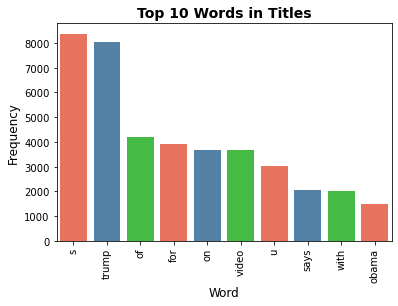

In [16]:
import re

# Function to process text from data frame
def preprocess_text(text, stopwords=None):
    """
    Function to clean and tokenize text.
    
    Params:
        text (str): The text to be processed.
        stopwords (list/set): A list or set of stopwords to exclude (default is None).

    Returns:
        list: A list of cleaned words (tokens).
    """
    if stopwords is None:
        stopwords = set(['the', 'a', 'and', 'is', 'to', 'in'])  # Default stopwords
    
    text = re.sub(r'\W+', ' ', text)  # Remove non-word characters
    tokens = text.lower().split()  # Convert text to lowercase and split it into words
    return [word for word in tokens if word not in stopwords]  # Remove stopwords

from collections import Counter

# Function to plot word distribution of Data frame dataset
def plot_word_distribution(df, column, stopwords=None, top_n=10, title="Top Words Distribution", bar_colors=None):
    """
    Function to preprocess text in a given column and plot the top N frequent words.

    Params:
        df (pd.DataFrame): The DataFrame containing the data.
        column (str): The column name containing text data to be processed.
        stopwords (list/set): A list or set of stopwords to exclude (default is None).
        top_n (int): Number of top frequent words to display (default is 10).
        title (str): Title of the plot (default is 'Top Words Distribution').
        bar_colors (list): List of colors for the bars in the plot (default is None).
    
    Returns:
        None
    """
    # Drop NaN values and apply text preprocessing
    all_words = df[column].dropna().apply(preprocess_text, stopwords=stopwords).sum()
    
    # Count word frequencies and get the top N most common words
    word_counts = Counter(all_words).most_common(top_n)
    
    # Create a DataFrame for plotting
    word_freq_df = pd.DataFrame(word_counts, columns=['word', 'frequency'])
    bar_colors=['#FF6347', '#4682B4', '#32CD32']
    # Plot the distribution
    sns.barplot(data=word_freq_df, x='word', y='frequency', palette=bar_colors)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Word', fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.xticks(rotation=90)
    plt.show()

# Assuming `final_concat_df` is your DataFrame and 'title' is the column containing text data
plot_word_distribution(fakenews_ds, 'title', stopwords=['the', 'a', 'and', 'is', 'to', 'in'], top_n=10, title="Top 10 Words in Titles")

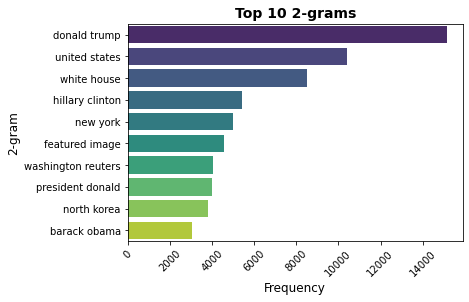

In [17]:
from sklearn.feature_extraction.text import CountVectorizer
#import pandas as pd
#import seaborn as sns
#import matplotlib.pyplot as plt

# Function to plot top nGrames
def plot_top_ngrams(text_data, n=2, top_n=10):
    """
    Function to extract and plot top n-grams from text data.

    Params:
        text_data (Series): Series containing text data.
        n (int): The size of the n-grams (default is 2 for bigrams).
        top_n (int): The number of top n-grams to display (default is 10).
    """
    # Initialize the CountVectorizer to extract n-grams
    vectorizer = CountVectorizer(ngram_range=(n, n), stop_words='english')
    
    # Fit and transform the text data to get n-grams
    ngrams = vectorizer.fit_transform(text_data.dropna())
    
    # Create a DataFrame to store n-gram counts
    ngram_counts = pd.DataFrame(ngrams.sum(axis=0), columns=vectorizer.get_feature_names_out(), index=['count']).T
    
    # Sort and get the top n-grams
    top_ngrams = ngram_counts.nlargest(top_n, 'count')
    
    # Plot the top n-grams
    sns.barplot(data=top_ngrams.reset_index(), x='count', y='index', palette='viridis')
    plt.title(f'Top {top_n} {n}-grams', fontsize=14, fontweight='bold')
    plt.xlabel('Frequency', fontsize=12)
    plt.ylabel(f'{n}-gram', fontsize=12)
    plt.xticks(rotation=45)
    plt.show()

# Assuming df['text'] contains the text data
plot_top_ngrams(fakenews_ds['text'], n=2, top_n=10)  # For bigrams


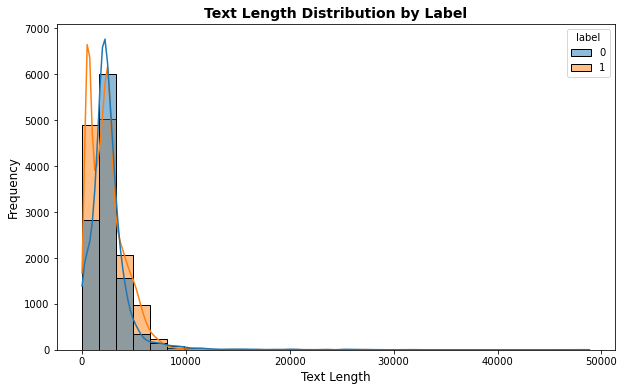

In [18]:
#import seaborn as sns
#import matplotlib.pyplot as plt

# Function for calculate text length of Data Frame and plot its distribution by label
def plot_text_length_distribution(df, text_column, label_column, bins=30):
    """
    Function to calculate text length and plot its distribution by label.

    Params:
        df (DataFrame): The DataFrame containing the text and label data.
        text_column (str): The name of the column containing the text data.
        label_column (str): The name of the column containing the label data.
        bins (int): The number of bins to use for the histogram (default is 30).

    Returns:
        None
    """
    # Calculate the text length for each entry in the text column
    df['text_length'] = df[text_column].apply(lambda x: len(str(x)))

    # Create a histogram with kde (Kernel Density Estimation) for the text length distribution
    plt.figure(figsize=(10, 6))  # Optional: set the figure size for better readability
    sns.histplot(data=df, x='text_length', hue=label_column, bins=bins, kde=True)

    # Add plot title and labels
    plt.title("Text Length Distribution by Label", fontsize=14, fontweight='bold')
    plt.xlabel('Text Length', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    
    # Show the plot
    plt.show()

# Usage:
# Assuming 'df' is your DataFrame and it has 'text' and 'label' columns
plot_text_length_distribution(fakenews_ds, text_column='text', label_column='label', bins=30)

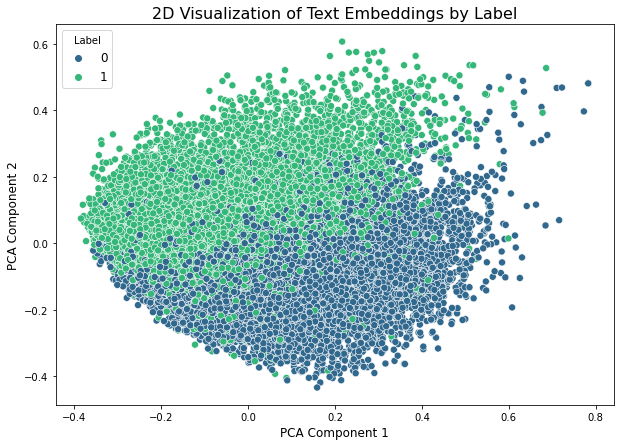

In [19]:
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
#import seaborn as sns
#import matplotlib.pyplot as plt


# Function apply PCA on TF-IDF Data Frame and plot its distribution by label
def plot_text_pca(df, text_column, label_column, max_features=100, n_components=2):
    """
    Function to apply PCA on TF-IDF features and plot a 2D scatter plot of text embeddings by label.

    Params:
        df (DataFrame): The DataFrame containing the text and label data.
        text_column (str): The name of the text column to be analyzed.
        label_column (str): The name of the column containing the label data.
        max_features (int): The maximum number of features (words) to consider for TF-IDF (default is 100).
        n_components (int): The number of principal components for PCA (default is 2).

    Returns:
        None
    """
    # Initialize TfidfVectorizer with the desired number of features
    tfidf = TfidfVectorizer(max_features=max_features)
    
    # Apply TF-IDF vectorizer on the text data
    tfidf_matrix = tfidf.fit_transform(df[text_column].fillna(''))
    
    # Apply PCA to reduce the dimensionality of the TF-IDF matrix to 2 components
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(tfidf_matrix.toarray())
    
    # Create a scatter plot of the PCA results with the labels
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df[label_column], palette='viridis', s=50)
    
    # Set plot title and axis labels
    plt.title('2D Visualization of Text Embeddings by Label', fontsize=16)
    plt.xlabel(f"PCA Component 1", fontsize=12)
    plt.ylabel(f"PCA Component 2", fontsize=12)
    plt.legend(title='Label', fontsize=12)
    plt.show()

# Usage:
# Assuming 'df' is your DataFrame and it has 'text' and 'label' columns
plot_text_pca(fakenews_ds, text_column='text', label_column='label', max_features=100, n_components=2)

### 2.1 Word Cloud Visualization for Text Data
A word cloud is a visual representation of word frequencies where the size of each word indicates how often it appears in the text. This code generates word clouds for each label in the dataset, allowing us to visually explore the most frequent terms for different categories.

In [20]:
!pip install wordcloud

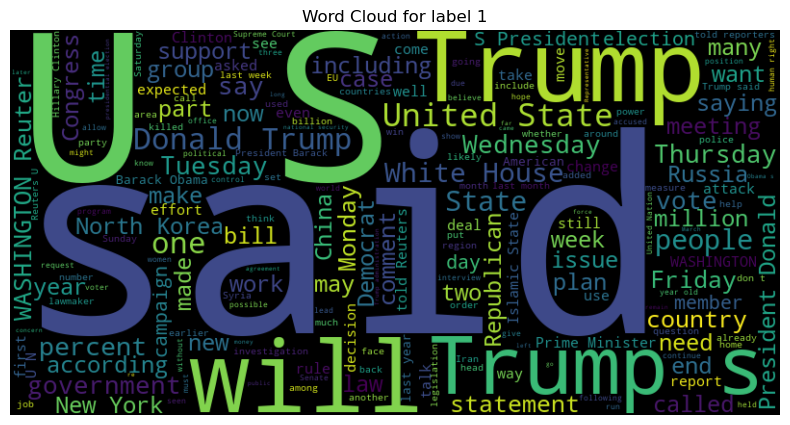

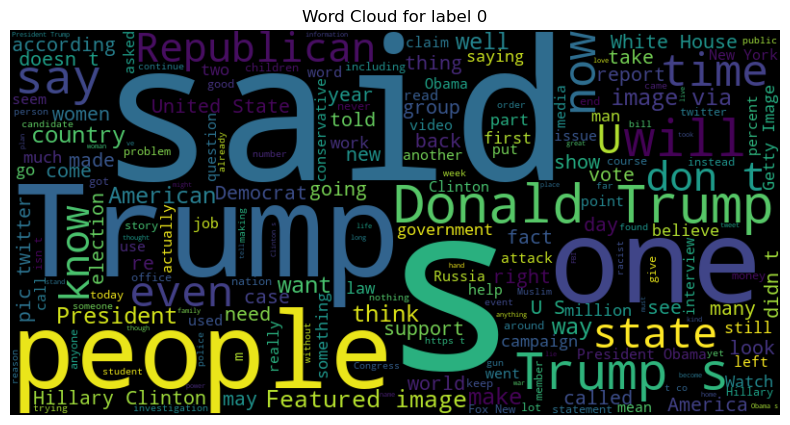

In [50]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordcloud(df, label_column, text_column, label):
    """
    Function to generate word cloud for a given label in a specified dataset.
    
    Params:
        df (DataFrame): The pandas DataFrame containing the data.
        label_column (str): The column name containing the labels.
        text_column (str): The column name containing the text data.
        label (str): The label for which to generate the word cloud.
    """
    # Extract all text related to the given label
    text = ' '.join(df[df[label_column] == label][text_column].fillna('').tolist())
    
    # Generate word cloud
    wordcloud = WordCloud(width=800,
                          height=400,
                          background_color='black').generate(text)
    
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')  # Display the word cloud
    plt.axis('off')  # Hide axis
    plt.title(f'Word Cloud for label {label}')
    plt.show()

# Usage:
# Assuming you have a DataFrame 'df' with columns 'label' and 'text'
# Loop through all unique labels in the DataFrame and generate a word cloud for each
for label in fakenews_ds['label'].unique():
    plot_wordcloud(fakenews_ds, label_column='label', text_column='text', label=label)

### 2.2 Word Co-Occurrence Heatmap for Text Data
This will explains how to compute and visualize the word co-occurrence matrix for a given text dataset. The goal is to understand the relationships between words based on their co-occurrence within the text.

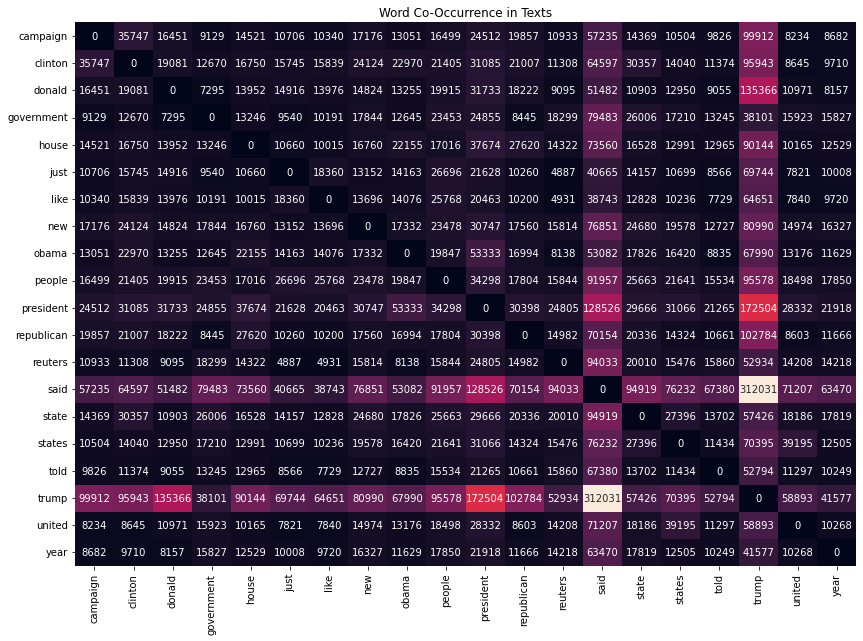

In [21]:
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def plot_word_cooccurrence(df, text_column, top_n=20):
    """
    Function to calculate and plot the word co-occurrence matrix from text data.
    
    Params:
        df (DataFrame): The pandas DataFrame containing the text data.
        text_column (str): The column name containing the text data.
        top_n (int): The number of top features (words) to consider for co-occurrence matrix (default is 20).
    """
    # Initialize CountVectorizer to get word frequency
    vectorizer = CountVectorizer(stop_words='english', max_features=top_n)
    X = vectorizer.fit_transform(df[text_column].dropna())

    # Compute word co-occurrence matrix by multiplying term-document matrix with its transpose
    word_cooccurrence = (X.T * X)  # Multiply term-document matrix by its transpose to get co-occurrence
    word_cooccurrence.setdiag(0)  # Remove diagonal (self-co-occurrence)

    # Convert to DataFrame for better readability and visualization
    word_cooccurrence_df = pd.DataFrame(word_cooccurrence.toarray(), 
                                         index=vectorizer.get_feature_names_out(), 
                                         columns=vectorizer.get_feature_names_out())

    # Plot the co-occurrence matrix as a heatmap
    plt.figure(figsize=(14, 10))
    sns.heatmap(data=word_cooccurrence_df, annot=True, cbar=False, fmt='d')
    plt.title('Word Co-Occurrence in Texts')
    plt.show()

# Example usage:
plot_word_cooccurrence(fakenews_ds, text_column='text', top_n=20)

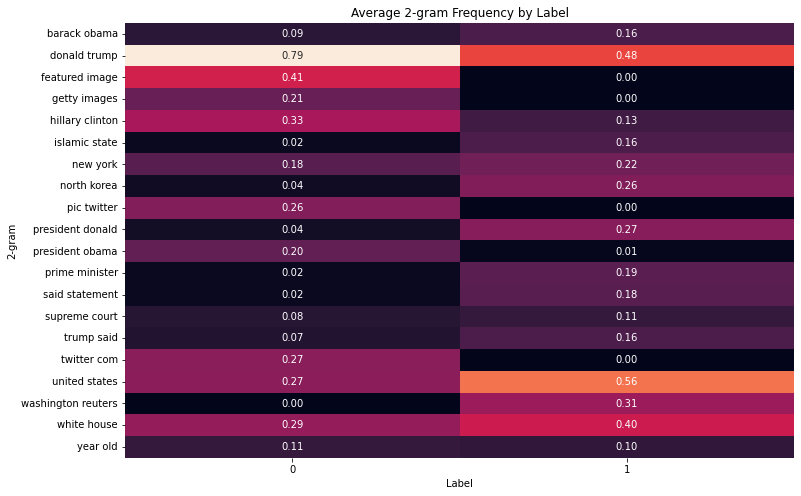

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

def plot_avg_bigram_frequency(df, text_column, label_column=None, ngram_range=(2, 2), top_n=20):
    """
    Function to extract bigrams from a given text column, compute average frequency by label, and plot a heatmap.

    Params:
        df (DataFrame): The pandas DataFrame containing the text data.
        text_column (str): The column name containing the text data.
        label_column (str, optional): The column name for grouping by labels. If None, no grouping is done.
        ngram_range (tuple, optional): The range of n-grams to extract (default is (2, 2) for bigrams).
        top_n (int, optional): The number of top n-grams to consider for the analysis (default is 20).
    """
    # Initialize CountVectorizer to extract ngrams
    vectorizer = CountVectorizer(ngram_range=ngram_range, stop_words='english', max_features=top_n)
    X = vectorizer.fit_transform(df[text_column].fillna(''))

    # Create a DataFrame of ngram counts
    ngrams_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

    # Add label column for grouping
    ngrams_df[label_column] = df[label_column] if label_column else 'All'

    # Calculate average ngram frequency for each label
    ngrams_avg = ngrams_df.groupby(label_column).mean().T

    # Plot as heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(data=ngrams_avg, 
                annot=True,
                cbar=False,
                fmt='.2f')
    plt.title(f'Average {ngram_range[0]}-gram Frequency by Label')
    plt.xlabel('Label')
    plt.ylabel(f'{ngram_range[0]}-gram')
    plt.show()
    
# Plotting Average Bigram Frequency by Label
plot_avg_bigram_frequency(fakenews_ds, text_column='text', label_column='label')

### 2.3 Radar Chart of Text Features by Label
This calculates various text metrics and visualizes them using a radar chart, grouped by labels.

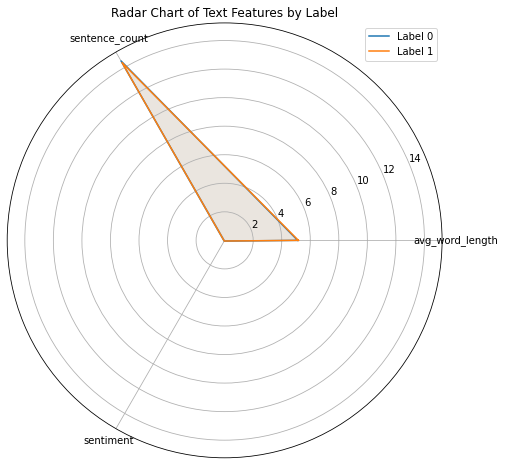

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from textblob import TextBlob
import pandas as pd

# Function to generate radar chart for text features grouped by label
def plot_radar_chart(df, text_column, label_column):
    """
    Function to generate a radar chart of text metrics by label.

    Params:
        df (DataFrame): The pandas DataFrame containing text and label data.
        text_column (str): The name of the column containing the text data.
        label_column (str): The name of the column containing the labels.
    """
    # Calculate text metrics
    df['avg_word_length'] = df[text_column].apply(lambda x: np.mean([len(word) for word in str(x).split()]) if x and len(str(x).split()) > 0 else 0)
    df['sentence_count'] = df[text_column].apply(lambda x: len(TextBlob(str(x)).sentences) if x else 0)
    df['sentiment'] = df[text_column].apply(lambda x: TextBlob(str(x)).sentiment.polarity if x else 0)

    # Aggregate metrics by label
    radar_data = df.groupby(label_column)[['avg_word_length', 'sentence_count', 'sentiment']].mean().fillna(0)

    # Create radar chart
    categories = list(radar_data.columns)
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

    # Iterate through radar_data to plot each label
    for i, row in radar_data.iterrows():
        values = row.values.flatten().tolist()
        values += values[:1]  # Close the loop
        angles = [n / float(len(categories)) * 2 * np.pi for n in range(len(categories))]
        angles += angles[:1]

        # Plot each label's values
        ax.plot(angles, values, label=f'Label {i}')
        ax.fill(angles, values, alpha=0.1)

    # Set category labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)

    # Add title and legend
    plt.title('Radar Chart of Text Features by Label')
    plt.legend(loc='upper right')
    plt.show()

# Usage:
plot_radar_chart(fakenews_ds, text_column='text', label_column='label')

### 2.4 Average Word Count and Sentiment by Label - Heatmap
Calculates and visualizes the average word count and sentiment polarity for different labels using a heatmap. The word count and sentiment polarity are aggregated by label, and a heatmap is plotted to show these values.

In [24]:
!pip install textblob

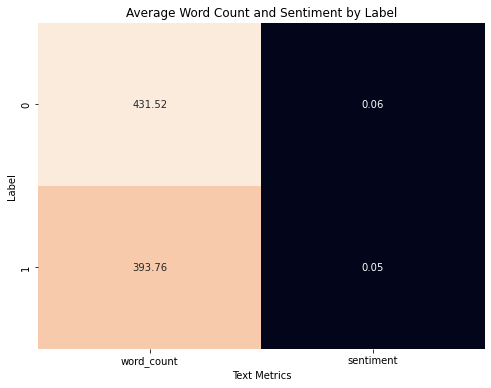

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob

def calculate_and_plot_word_sentiment(df, text_column, label_column):
    """
    Calculate the average word count and sentiment polarity for each label and plot the results as a heatmap.
    
    Parameters:
    - df (DataFrame): The input DataFrame containing the text and label columns.
    - text_column (str): The name of the column containing the text data.
    - label_column (str): The name of the column containing the label data.
    """
    # Step 1: Calculate word count for each text entry
    df['word_count'] = df[text_column].apply(lambda x: len(str(x).split()))
    
    # Step 2: Calculate sentiment polarity for each text entry
    df['sentiment'] = df[text_column].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
    
    # Step 3: Aggregate mean values for word count and sentiment by label
    heatmap_data = df.groupby(label_column)[['word_count', 'sentiment']].mean()

    # Step 4: Plot the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(data=heatmap_data, 
                annot=True,  # Display values in each cell
                cbar=False,  # Hide color bar
                fmt='.2f')  # Format the values to two decimal places
    plt.title('Average Word Count and Sentiment by Label')
    plt.xlabel('Text Metrics')  # Label for the x-axis
    plt.ylabel('Label')  # Label for the y-axis
    plt.show()

# Call the function with the sample DataFrame
calculate_and_plot_word_sentiment(fakenews_ds, text_column='text', label_column='label')


## 3. Energy Consumption Dataset Data Visualization

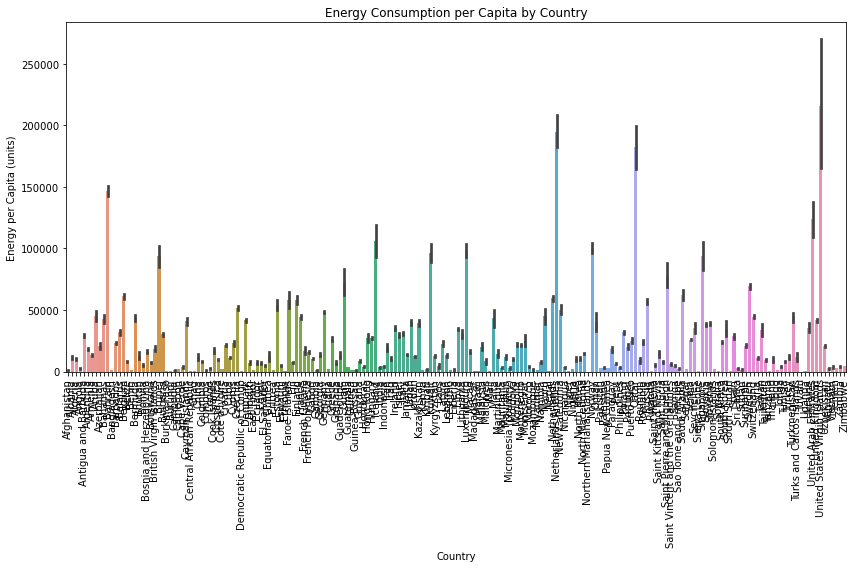

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

def filter_missing_values(df, column):
    """
    Filters out rows with missing values in the specified column.
    
    Args:
        df (pd.DataFrame): The dataset.
        column (str): The column name to check for missing values.
    
    Returns:
        pd.DataFrame: The filtered dataset without missing values in the specified column.
    """
    return df[df[column].notna()]

def plot_energy_consumption_by_country(df, energy_column, country_column):
    """
    Plots energy consumption per capita by country.
    
    Args:
        df (pd.DataFrame): The dataset containing energy consumption and country data.
        energy_column (str): The column name for energy consumption values.
        country_column (str): The column name for country names.
    """
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.barplot(data=df, x=country_column, y=energy_column, ax=ax)
    ax.set_title('Energy Consumption per Capita by Country')
    ax.set_xlabel('Country')
    ax.set_ylabel('Energy per Capita (units)')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

def process_and_plot_energy_data(df, energy_column, country_column):
    """
    Processes the energy dataset by filtering missing values and plotting energy consumption by country.
    
    Args:
        df (pd.DataFrame): The original dataset containing country and energy consumption data.
        energy_column (str): The column name for energy consumption values.
        country_column (str): The column name for country names.
    """
    # Step 1: Filter out rows with missing energy consumption values
    df_filtered = filter_missing_values(df, energy_column)

    # Step 2: Plot the energy consumption by country
    plot_energy_consumption_by_country(df_filtered, energy_column, country_column)

# Usage
# 'energy_ds' is the dataset containing 'country' and 'energy_per_capita' columns
# energy_ds = pd.read_csv('your_energy_data.csv')  # Replace with your actual data

# Run the function to process and plot the energy consumption data
process_and_plot_energy_data(energy_ds, 'energy_per_capita', 'country')

### 3.1 Plots energy consumption per capita by continent

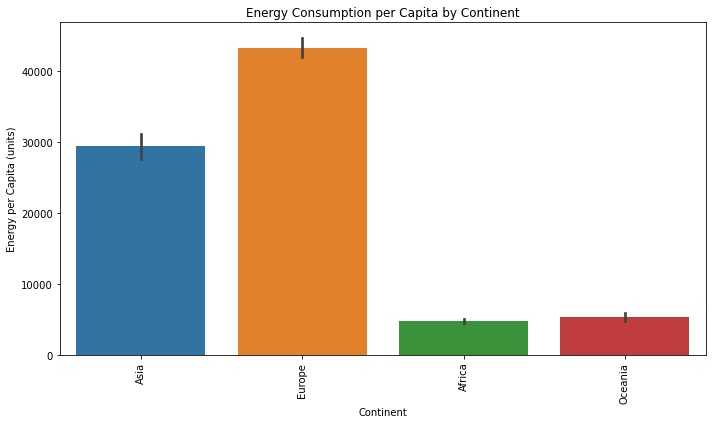

In [27]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# Create a continent mapping
continent_map = {
    'Africa': ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo', 'Cote d\'Ivoire', 'Democratic Republic of the Congo', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan', 'Sudan', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Asia': ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei Darussalam', 'Cambodia', 'China', 'Cyprus', 'Georgia', 'India', 'Indonesia', 'Iran', 'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'North Korea', 'Oman', 'Pakistan', 'Palestine', 'Philippines', 'Qatar', 'Saudi Arabia', 'Singapore', 'South Korea', 'Sri Lanka', 'Syria', 'Taiwan', 'Tajikistan', 'Thailand', 'Timor-Leste', 'Turkey', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'],
    'Europe': ['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Moldova', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican City'],
    'Oceania': ['Australia', 'Fiji', 'New Zealand', 'Papua New Guinea'],
}

def add_continent_column(df, continent_map):
    """
    Adds a 'continent' column to the dataset by mapping country names to continents.
    
    Args:
        df (pd.DataFrame): The dataset containing a 'country' column.
        continent_map (dict): A dictionary mapping continents to countries.
    
    Returns:
        pd.DataFrame: The original dataset with an additional 'continent' column.
    """
    df['continent'] = df['country'].map(lambda x: next((k for k, v in continent_map.items() if x in v), None))
    df = df[df['continent'].notna()]  # Filter out rows without a continent
    return df

def plot_energy_consumption(df):
    """
    Plots energy consumption per capita by continent.

    Args:
        df (pd.DataFrame): The dataset containing 'energy_per_capita' and 'continent' columns.
    """
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x='continent', y='energy_per_capita')
    plt.title('Energy Consumption per Capita by Continent')
    plt.xlabel('Continent')
    plt.ylabel('Energy per Capita (units)')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

def process_and_plot_energy_data(df, continent_map):
    """
    Processes the energy dataset by cleaning missing values and mapping continents, 
    and then plots the energy consumption per capita by continent.

    Args:
        df (pd.DataFrame): The original dataset containing 'country' and 'energy_per_capita'.
        continent_map (dict): A dictionary mapping continents to countries.
    """
    # Filter out rows with missing 'energy_per_capita'
    df_filtered = df[df['energy_per_capita'].notna()]

    # Add continent column
    df_with_continent = add_continent_column(df_filtered, continent_map)

    # Plot energy consumption per capita by continent
    plot_energy_consumption(df_with_continent)

# Usage
# 'energy_ds' is the dataset containing 'country' and 'energy_per_capita' columns
# energy_ds = pd.read_csv('your_energy_data.csv')  # Replace with your actual data

# Run the function to process and plot the energy consumption data
process_and_plot_energy_data(energy_ds, continent_map)

### 3.2 Energy consumption breakdown by source.

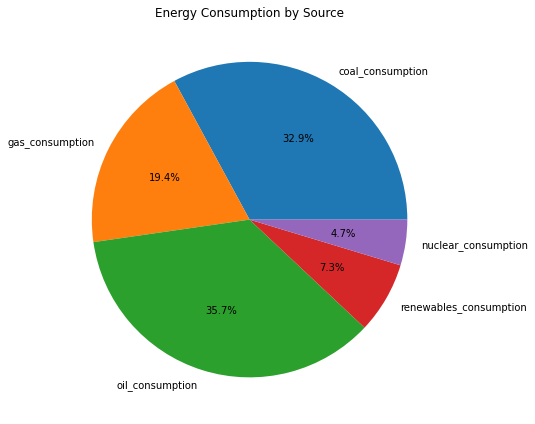

In [28]:
import matplotlib.pyplot as plt

def plot_energy_consumption_by_source(df, source_columns):
    """
    Plots a pie chart showing the energy consumption breakdown by source.
    
    Args:
        df (pd.DataFrame): The dataset containing energy consumption data.
        source_columns (list): A list of column names representing different energy sources.
    """
    # Sum the values across the specified source columns
    energy_consumption = df[source_columns].sum()
    
    # Create the pie chart
    fig, ax = plt.subplots(figsize=(10, 6))
    energy_consumption.plot(kind='pie', ax=ax, autopct='%1.1f%%')
    ax.set_title('Energy Consumption by Source')
    ax.set_ylabel('')  # Removes the label of the pie chart (default is the column name)
    plt.tight_layout()
    plt.show()


# Example usage:
# 'dataset' is a DataFrame with columns like 'coal_consumption', 'gas_consumption', etc.
source_columns = ['coal_consumption', 'gas_consumption', 'oil_consumption', 'renewables_consumption', 'nuclear_consumption']
plot_energy_consumption_by_source(energy_ds, source_columns)

### 3.3 Relationship between energy consumption and greenhouse gas emissions.

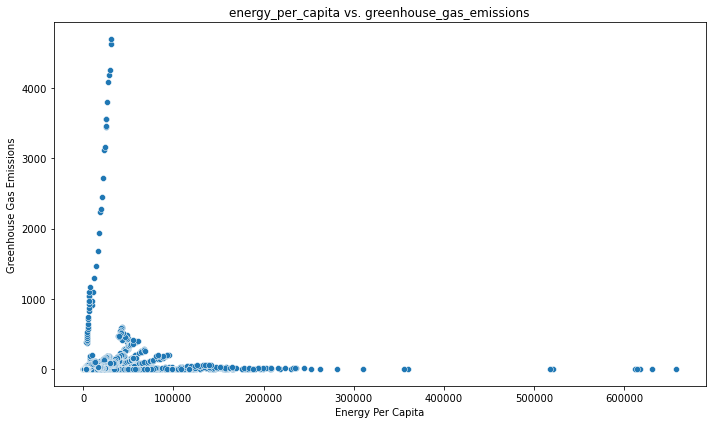

In [29]:
# import seaborn as sns
# import matplotlib.pyplot as plt

def plot_energy_vs_emissions(df, x_col, y_col):
    """
    Plots a scatter plot showing the relationship between energy consumption and greenhouse gas emissions.
    
    Args:
        df (pd.DataFrame): The dataset containing energy and emission data.
        x_col (str): The column name for energy consumption data (e.g., 'energy_per_capita').
        y_col (str): The column name for greenhouse gas emissions data (e.g., 'greenhouse_gas_emissions').
    """
    # Create the scatter plot
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.scatterplot(data=df, x=x_col, y=y_col, ax=ax)
    
    # Set the plot's title and labels
    ax.set_title(f'{x_col} vs. {y_col}')
    ax.set_xlabel(x_col.replace('_', ' ').title())
    ax.set_ylabel(y_col.replace('_', ' ').title())
    
    # Adjust layout for better presentation
    plt.tight_layout()
    plt.show()

# Usage:
# 'dataset' is a DataFrame with columns like 'energy_per_capita' and 'greenhouse_gas_emissions'
plot_energy_vs_emissions(energy_ds, 'energy_per_capita', 'greenhouse_gas_emissions')


### 3.4 Generate the time series plot for electricity consumption

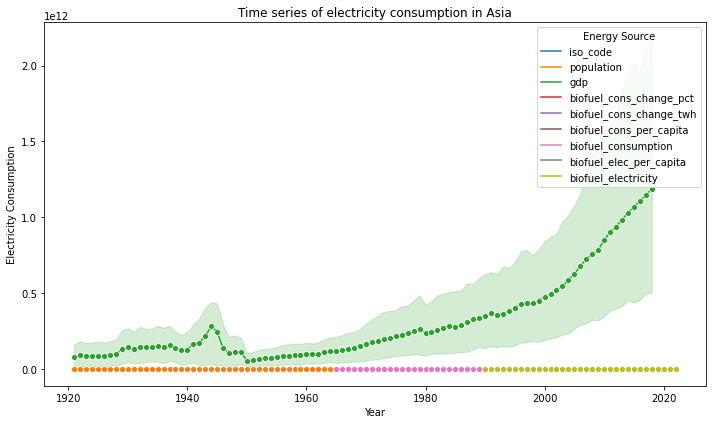

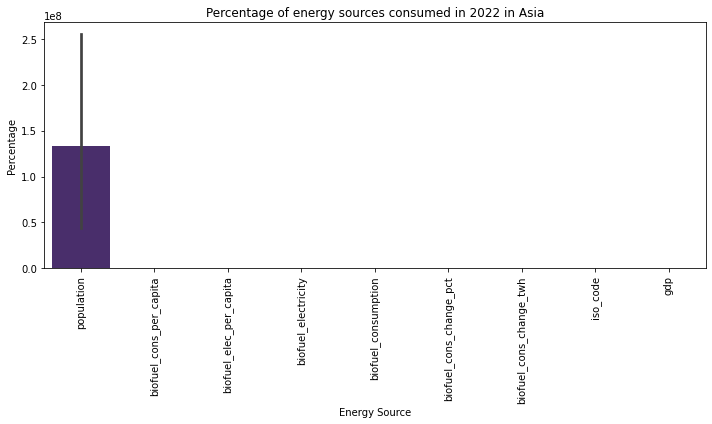

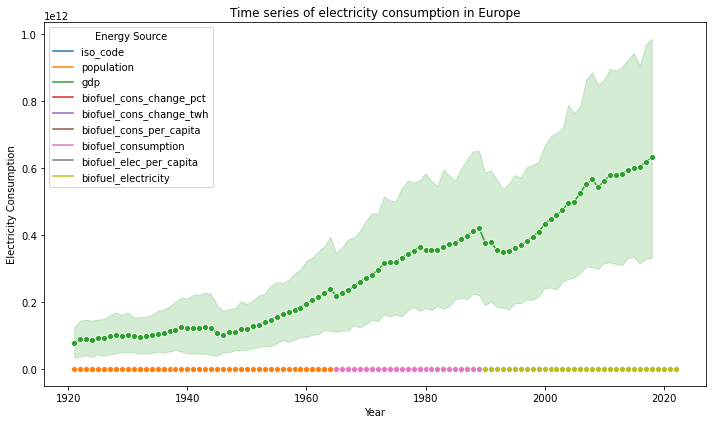

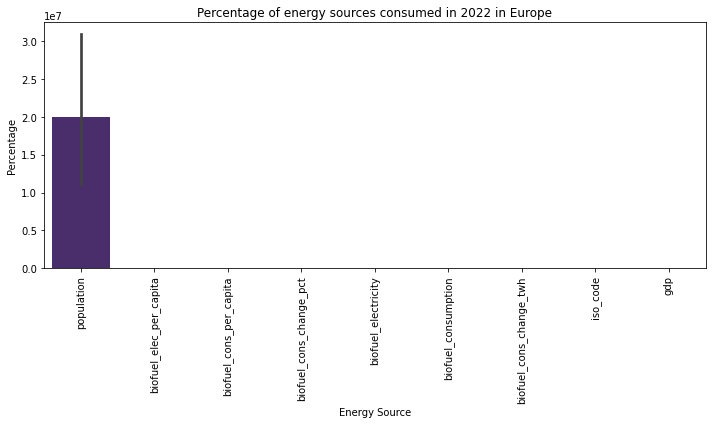

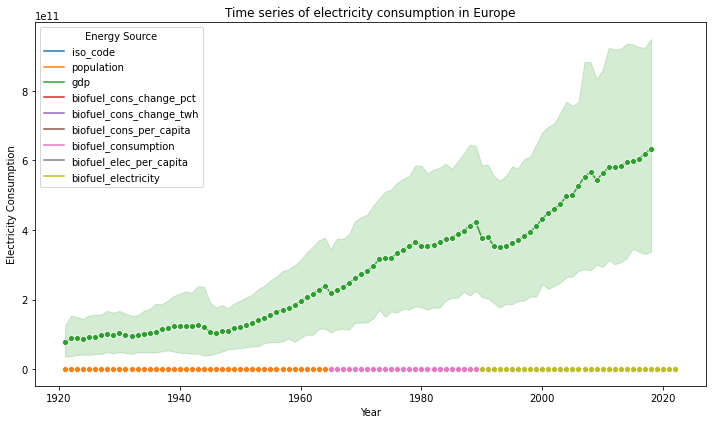

...

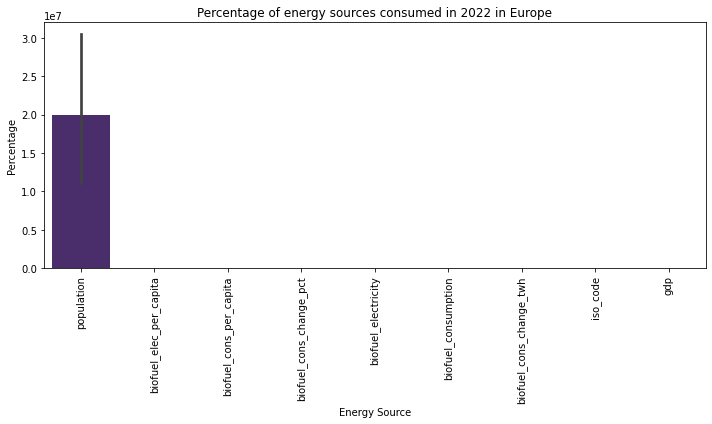

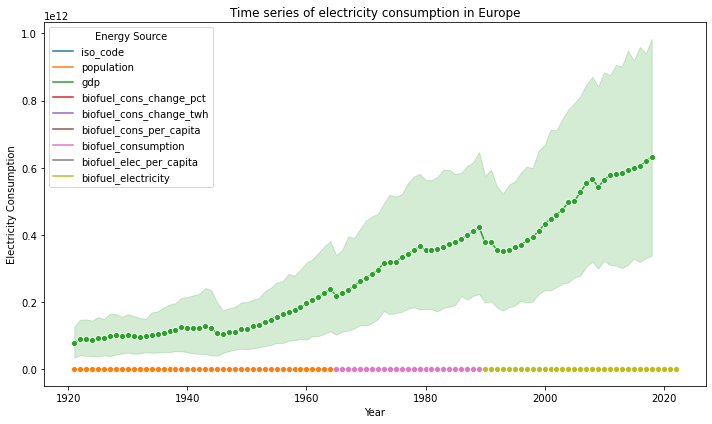

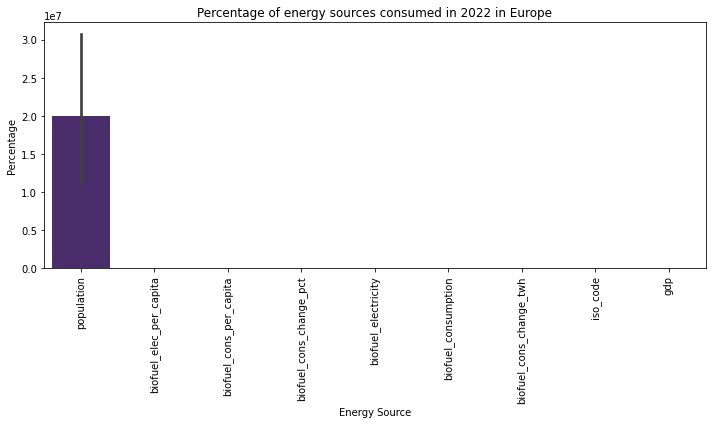

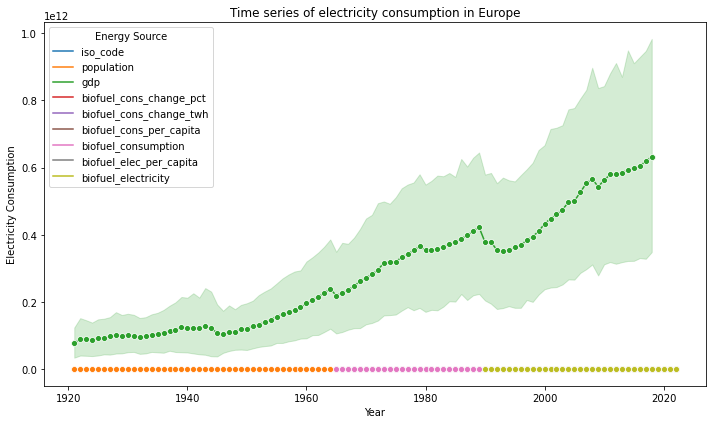

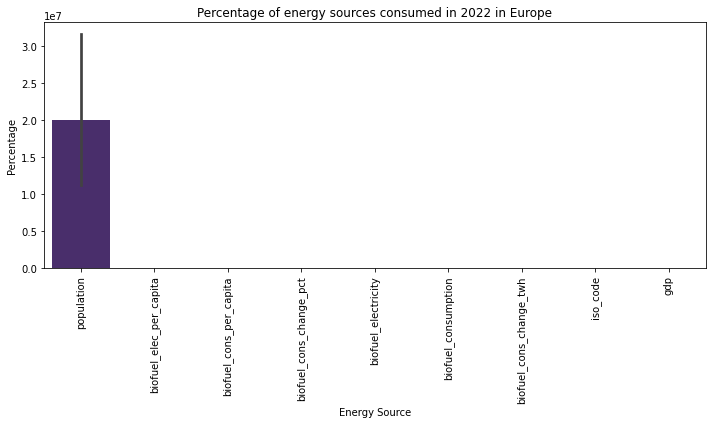

In [30]:
import plotly.express as px

# Function to generate the time series plot for electricity consumption
def generate_time_series_plot(energy_df1, country):
    country_data = energy_df1[energy_df1['continent'] == country]
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=country_data, x='year', y='value', hue='variable', marker='o')
    plt.title(f"Time series of electricity consumption in {country}")
    plt.xlabel('Year')
    plt.ylabel('Electricity Consumption')
    plt.legend(title='Energy Source')
    plt.tight_layout()
    plt.show()

# Function to generate the pie chart for renewable vs non-renewable consumption
def generate_pie_chart(energy_df2, country):
    country_data = energy_df2[(energy_df2['continent'] == country) & (energy_df2['year'] == 2022)]
    fig = px.pie(country_data, names='variable', values='value', title=f"Percentage of renewable and non-renewable electricity in {country} (2022)", 
                 color_discrete_map={'renewable': '#EC754A', 'non-renewable': '#BE2A3E'})
    fig.update_traces(textinfo='percent+label')
    fig.update_layout(margin=dict(t=40, b=40, l=40, r=40))
    fig.show()

# Function to generate the bar plot for energy source consumption in 2022
def generate_bar_plot(energy_df1, country):
    country_data = energy_df1[(energy_df1['continent'] == country) & (energy_df1['year'] == 2022)]
    country_data_sorted = country_data.sort_values(by='value', ascending=False)
    
    plt.figure(figsize=(10, 6))
    sns.barplot(data=country_data_sorted, x='variable', y='value', palette='viridis')
    plt.title(f"Percentage of energy sources consumed in 2022 in {country}")
    plt.xlabel('Energy Source')
    plt.ylabel('Percentage')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

# Main function to filter and generate plots for each country
def generate_country_plots(df, year=2022):
    df3 = df[df['year'] == year].sort_values(by='total', ascending=False)
    
    for _, row in df3.iterrows():
        country = row['continent']
        
        # Check if non-renewable consumption is greater than renewable consumption
        if row['not_renewable'] < row['renewable']:
            
            # Generate individual plots
            generate_time_series_plot(energy_df1, country)
            generate_pie_chart(energy_df2, country)
            generate_bar_plot(energy_df1, country)

# Add continent column
df_with_continent = add_continent_column(energy_ds, continent_map)
# Ensure all the relevant columns are numeric
df_with_continent.iloc[:, 2:11] = df_with_continent.iloc[:, 2:11].apply(pd.to_numeric, errors='coerce')

# Calculate the total electricity consumption
df_with_continent['total'] = df_with_continent.iloc[:, 2:11].sum(axis=1)

# Remove rows with missing 'total' values
df_with_continent = df_with_continent[df_with_continent['total'].notna()]

# Calculate the percentage of each energy source
for col in ['biofuel_electricity', 'hydro_electricity', 'nuclear_electricity', 'solar_electricity', 
            'wind_electricity', 'other_renewable_electricity', 'coal_electricity', 'gas_electricity', 'oil_electricity']:
    df_with_continent[f'{col}_perc'] = (df_with_continent[col] / df_with_continent['total']) * 100

# Create renewable and non-renewable columns
df_with_continent['renewable'] = df_with_continent[['biofuel_electricity', 'hydro_electricity', 'nuclear_electricity', 
                                    'solar_electricity', 'wind_electricity', 'other_renewable_electricity']].sum(axis=1)
df_with_continent['not_renewable'] = df_with_continent[['coal_electricity', 'gas_electricity', 'oil_electricity']].sum(axis=1)

# Reshape the data for time series plots
energy_df1 = pd.melt(df_with_continent, id_vars=['continent', 'year'], value_vars=df_with_continent.columns[2:11], var_name='variable', value_name='value')

# Reshape the data for renewable vs non-renewable pie chart
energy_df2 = pd.melt(df_with_continent[['continent', 'year', 'renewable', 'not_renewable']], id_vars=['continent', 'year'], var_name='variable', value_name='value')

# Example usage:
# df, df1, df2 are assumed to be prepared as in the previous steps

generate_country_plots(df_with_continent, year=2022)

# Data Preprocessing

## 1. Hotel Booking Dataset Preprocessing

In [31]:
# Data Sampling (40%)
hotel_data_sample = hotel_ds.sample(frac=0.4, random_state=42)

In [32]:
# Preprocessing: Encoding categorical features
encoder = LabelEncoder()
for col in hotel_data_sample.select_dtypes(include='object').columns:
    hotel_data_sample[col] = encoder.fit_transform(hotel_data_sample[col])

In [33]:
hotel_data_sample = hotel_data_sample.fillna(hotel_data_sample.mode().iloc[0])

## 2. Fake News Dataset Preprocessing

In [34]:
!pip install torch

In [35]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, roc_auc_score
from torch.utils.data import DataLoader, TensorDataset
from sklearn.feature_extraction.text import TfidfVectorizer

# Clean text data
def clean_text(text):
    text = text.lower()
    text = re.sub(r'\d+', '', text)  # Remove digits
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    return text

vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')

# Data Sampling (40%)
fakenews_ds_sample = fakenews_ds.sample(frac=0.4, random_state=42)

## 3. Energy Consumption Dataset Preprocessing

In [36]:
# Data preprocessing
# Handle missing values
for column in energy_ds.columns:
    if energy_ds[column].dtype == 'object':
        energy_ds[column].fillna(energy_ds[column].mode()[0], inplace=True)
    else:
        energy_ds[column].fillna(energy_ds[column].median(), inplace=True)

# Encode categorical features
label_encoders = {}
for column in energy_ds.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    energy_ds[column] = le.fit_transform(energy_ds[column])
    label_encoders[column] = le

# Handle missing values (e.g., fill NaNs with the column mean or drop them)
energy_ds = energy_ds.fillna(energy_ds.mean(numeric_only=True))

# Drop rows where the target variable is still NaN
energy_ds = energy_ds.dropna()

# Select relevant features and target variable
# Predicting 'biofuel_consumption' using population, GDP, and other energy metrics
features = ['year','population', 'gdp', 'solar_share_energy', 'wind_share_energy']

target = 'biofuel_consumption'

# Feature Selection

## 1. Hotel Booking Dataset Feature Selection

In [37]:
hotel_X = hotel_data_sample.drop(columns=["is_canceled"])
hotel_y = hotel_data_sample["is_canceled"]

## 2. Fake News Dataset Feature Selection

In [38]:
fakenews_X = vectorizer.fit_transform(fakenews_ds_sample['title'] + " " + fakenews_ds_sample['text']).toarray()
fakenews_y = fakenews_ds_sample['label'].values  # labels for training

fakenews_X_tensor = torch.tensor(fakenews_X, dtype=torch.float32)
fakenews_y_tensor = torch.tensor(fakenews_y, dtype=torch.float32).unsqueeze(1)

## 3. Energy Consumption Dataset Feature Selection

In [39]:
# Define features and target
energy_X = energy_ds[features]
energy_y = energy_ds[target]

# Train-Test Split

## 1. Hotel Booking Dataset Train-Test Split

In [40]:
hotel_X_train, hotel_X_test, hotel_y_train, hotel_y_test = train_test_split(hotel_X, hotel_y, test_size=0.2, random_state=42)

In [41]:
hotel_X_train = hotel_X_train.dropna()
hotel_y_train = hotel_y_train.loc[hotel_X_train.index]
hotel_X_test = hotel_X_test.dropna()
hotel_y_test = hotel_y_test.loc[hotel_X_test.index]

## 2. Fake News Dataset Dataset Train-Test Split

In [42]:
kf = KFold(n_splits=5, shuffle=True, random_state=101)
fold_results = []
best_accuracy = 0
best_auc = 0
best_model_state = None
fakenews_y_test = None
fakenews_y_pred_kf = None

In [43]:
fakenews_ds_sample['cleaned_text'] = fakenews_ds_sample['text'].apply(clean_text)

# Encode labels
label_encoder = LabelEncoder()
fakenews_ds_sample['encoded_label'] = label_encoder.fit_transform(fakenews_ds_sample['label'])

# Split data into train and test sets
fakenews_X_train, fakenews_X_test, fakenews_y_train, fakenews_y_test = train_test_split(fakenews_ds_sample['cleaned_text'], fakenews_ds_sample['encoded_label'], test_size=0.2, random_state=42)


In [44]:
# Apply TF-IDF vectorization
vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
fakenews_X_train_tfidf = vectorizer.fit_transform(fakenews_X_train)
fakenews_X_test_tfidf = vectorizer.transform(fakenews_X_test)

## 3. Energy Consumption Dataset Train-Test Split

In [45]:
# Split dataset into train and test sets
energy_X_train, energy_X_test, energy_y_train, energy_y_test = train_test_split(energy_X, energy_y, test_size=0.2, random_state=42)


# Modelling

In [46]:
# Confusion Matrix Visualization
def plot_confusion_matrix(cm, title, cmap):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=False)
    plt.title(title)
    plt.ylabel('True Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

## 1. Model Training and Comparison for Hotel Bookings

In [47]:
# Model 1: Random Forest
hotel_rf = RandomForestClassifier(random_state=42)
hotel_rf.fit(hotel_X_train, hotel_y_train)
hotel_rf_pred = hotel_rf.predict(hotel_X_test)

In [48]:
# Evaluation
print("\nHotel Bookings Accuracy:")
print("Random Forest:", accuracy_score(hotel_y_test, hotel_rf_pred))


Hotel Bookings Accuracy:
Random Forest: 0.9997906197654941


In [49]:
print("\nClassification Report for Random Forest:")
print(classification_report(hotel_y_test, hotel_rf_pred))


Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5961
           1       1.00      1.00      1.00      3591

    accuracy                           1.00      9552
   macro avg       1.00      1.00      1.00      9552
weighted avg       1.00      1.00      1.00      9552



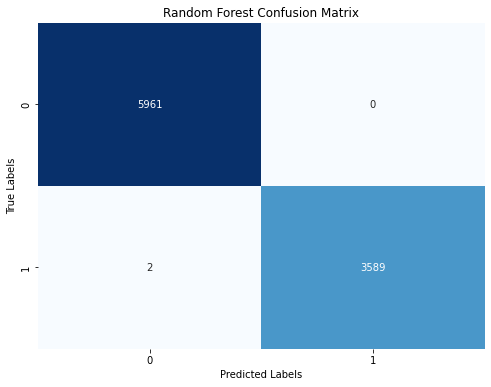

In [50]:
# Confusion matrix
hotel_rf_cm = confusion_matrix(hotel_y_test, hotel_rf_pred)
plot_confusion_matrix(hotel_rf_cm, "Random Forest Confusion Matrix", cmap="Blues")

In [51]:
# Model 2: Logistic Regression
hotel_logreg = LogisticRegression(max_iter=1000, random_state=42)
hotel_logreg.fit(hotel_X_train, hotel_y_train)
hotel_logreg_pred = hotel_logreg.predict(hotel_X_test)

In [52]:
# Evaluation
print("\nHotel Bookings Accuracy:")
print("Logistic Regression:", accuracy_score(hotel_y_test, hotel_logreg_pred))


Hotel Bookings Accuracy:
Logistic Regression: 0.7198492462311558


In [53]:
print("\nClassification Report for Logistic Regression:")
print(classification_report(hotel_y_test, hotel_logreg_pred))


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.73      0.87      0.80      5961
           1       0.69      0.47      0.56      3591

    accuracy                           0.72      9552
   macro avg       0.71      0.67      0.68      9552
weighted avg       0.71      0.72      0.71      9552



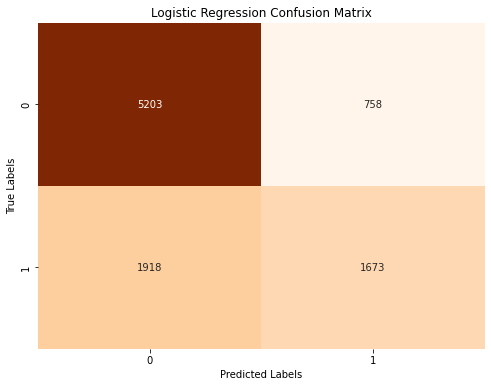

In [54]:
hotel_logreg_cm = confusion_matrix(hotel_y_test, hotel_logreg_pred)
plot_confusion_matrix(hotel_logreg_cm, "Logistic Regression Confusion Matrix", cmap="Oranges")

In [55]:
# Model 3: Support Vector Classifier
hotel_svc = SVC(random_state=42)
hotel_svc.fit(hotel_X_train, hotel_y_train)
hotel_svc_pred = hotel_svc.predict(hotel_X_test)

In [56]:
# Evaluation
print("Hotel Prediction Accuracy:")
print("SVC:", accuracy_score(hotel_y_test, hotel_svc_pred))

Hotel Prediction Accuracy:
SVC: 0.6240577889447236


In [57]:
print("\nClassification Report for SVC:")
print(classification_report(hotel_y_test, hotel_svc_pred))


Classification Report for SVC:
              precision    recall  f1-score   support

           0       0.62      1.00      0.77      5961
           1       0.00      0.00      0.00      3591

    accuracy                           0.62      9552
   macro avg       0.31      0.50      0.38      9552
weighted avg       0.39      0.62      0.48      9552



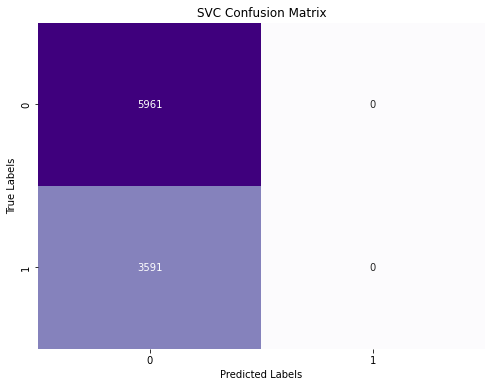

In [58]:
hotel_svc_cm = confusion_matrix(hotel_y_test, hotel_svc_pred)
plot_confusion_matrix(hotel_svc_cm, "SVC Confusion Matrix", cmap="Purples")

## 2. Model Training and Comparison for Fake News

In [59]:
import re
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
class FakeNewsBinaryClassifier(nn.Module):
    """
    A binary classification neural network model for fake news detection.
    """
    def __init__(self, input_dim):
        super(FakeNewsBinaryClassifier, self).__init__()
        self.network = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.network(x)
device = "cpu"

### 2.1 K-Fold Cross-Validation

In [60]:
# 5-Fold Cross-Validation
# Store fold-specific confusion matrices and reports
for fold, (train_idx, val_idx) in enumerate(kf.split(fakenews_X_tensor)):
    print(f"Fold {fold+1} Classification Report")
    # split data for this fold
    X_train, X_val = fakenews_X_tensor[train_idx], fakenews_X_tensor[val_idx]
    y_train, y_val = fakenews_y_tensor[train_idx], fakenews_y_tensor[val_idx]

    # DataLoader for the current fold
    train_dataset = TensorDataset(X_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)

    # initialize model, loss function, and optimizer for each fold
    model = FakeNewsBinaryClassifier(input_dim=1000).to(device)
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    # training loop for each fold
    num_epochs = 5
    for epoch in range(num_epochs):
        model.train()
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)  # move inputs and labels to device
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}')

    # evaluate on the validation set
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val)
        val_preds = (val_outputs >= 0.5).float()

        # calculate metrics for the current fold
        accuracy = accuracy_score(y_val.cpu(), val_preds.cpu())
        auc = roc_auc_score(y_val.cpu(), val_outputs.cpu())
        print(f'Fold {fold+1} Accuracy: {accuracy:.4f}, AUC: {auc:.4f}')

        # store results for this fold
        fold_results.append((accuracy, auc))

        # Generate classification report and confusion matrix
        val_preds_np = val_preds.cpu().numpy()
        y_val_np = y_val.cpu().numpy()
        
        # save the model if it's the best based on AUC
        if auc > best_auc:
            best_accuracy = accuracy
            best_auc = auc
            best_model_state = model.state_dict()  # save the best model's state_dict
            fakenews_y_test = y_val_np
            fakenews_y_pred_kf = val_preds_np

Fold 1 Classification Report
Epoch 1/5, Loss: 0.0903
Epoch 2/5, Loss: 0.1348
Epoch 3/5, Loss: 0.0004
Epoch 4/5, Loss: 0.0000
Epoch 5/5, Loss: 0.0000
Fold 1 Accuracy: 0.9620, AUC: 0.9915
Fold 2 Classification Report
Epoch 1/5, Loss: 0.0310
Epoch 2/5, Loss: 0.0225
Epoch 3/5, Loss: 0.0003
Epoch 4/5, Loss: 0.0000
Epoch 5/5, Loss: 0.0000
Fold 2 Accuracy: 0.9620, AUC: 0.9885
Fold 3 Classification Report
Epoch 1/5, Loss: 0.0008
Epoch 2/5, Loss: 0.0002
Epoch 3/5, Loss: 0.0000
Epoch 4/5, Loss: 0.0000
Epoch 5/5, Loss: 0.0000
Fold 3 Accuracy: 0.9615, AUC: 0.9917
Fold 4 Classification Report
Epoch 1/5, Loss: 0.1003
Epoch 2/5, Loss: 0.0004
Epoch 3/5, Loss: 0.0016
Epoch 4/5, Loss: 0.0000
Epoch 5/5, Loss: 0.0000
Fold 4 Accuracy: 0.9559, AUC: 0.9915
Fold 5 Classification Report
Epoch 1/5, Loss: 0.0000
Epoch 2/5, Loss: 0.0181
Epoch 3/5, Loss: 0.0000
Epoch 4/5, Loss: 0.0000
Epoch 5/5, Loss: 0.0000
Fold 5 Accuracy: 0.9420, AUC: 0.9893


In [61]:
if auc > best_auc:
    best_accuracy = accuracy
    best_auc = auc
    best_model_state = model.state_dict()

if best_model_state is not None:
    torch.save(best_model_state, 'fake_news_classifier.pth')
    print(f'Best Model w/ Accuracy: {best_accuracy:.4f}, AUC: {best_auc:.4f}')


Best Model w/ Accuracy: 0.9615, AUC: 0.9917


In [62]:
# Evaluation
print("\nFake News Data Accuracy:")
print("K-Fold Cross-Validation Accuracy :", accuracy_score(fakenews_y_test, fakenews_y_pred_kf))


Fake News Data Accuracy:
K-Fold Cross-Validation Accuracy : 0.9614989733059548


In [63]:
# Evaluate performance
print('K-Fold Cross-Validation Classifier:')
print(classification_report(fakenews_y_test, fakenews_y_pred_kf))

K-Fold Cross-Validation Classifier:
              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96       856
         1.0       0.98      0.95      0.97      1092

    accuracy                           0.96      1948
   macro avg       0.96      0.96      0.96      1948
weighted avg       0.96      0.96      0.96      1948



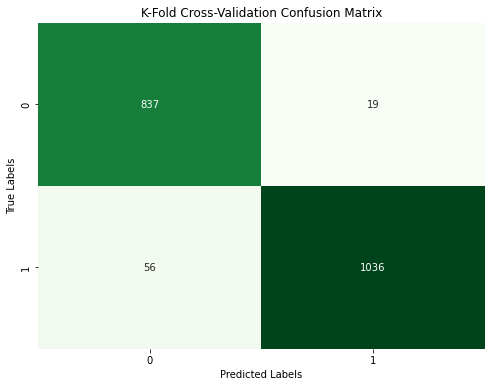

In [64]:
fakenews_nb_cm = confusion_matrix(fakenews_y_test, fakenews_y_pred_kf)
plot_confusion_matrix(fakenews_nb_cm, "K-Fold Cross-Validation Confusion Matrix", cmap="Greens")

### 2.2 Naive Bayes

In [65]:
from sklearn.naive_bayes import MultinomialNB

fakenews_y1_test = fakenews_y_test

fakenews_ds_sample['cleaned_text'] = fakenews_ds_sample['text'].apply(clean_text)

# Encode labels
label_encoder = LabelEncoder()
fakenews_ds_sample['encoded_label'] = label_encoder.fit_transform(fakenews_ds_sample['label'])

# Split data into train and test sets
fakenews_X_train, fakenews_X_test, fakenews_y_train, fakenews_y_test = train_test_split(fakenews_ds_sample['cleaned_text'], fakenews_ds_sample['encoded_label'], test_size=0.2, random_state=42)


# Naive Bayes Model
fakenews_nb_model = MultinomialNB()
fakenews_nb_model.fit(fakenews_X_train_tfidf, fakenews_y_train)
fakenews_y_pred_nb = fakenews_nb_model.predict(fakenews_X_test_tfidf)


In [66]:
# Evaluation
print("\nFake News Data Accuracy:")
print("Naive Bayes Accuracy :", accuracy_score(fakenews_y_test, fakenews_y_pred_nb))


Fake News Data Accuracy:
Naive Bayes Accuracy : 0.9091841970241149


In [67]:
# Evaluate performance
print('Naive Bayes Classifier:')
print(classification_report(fakenews_y_test, fakenews_y_pred_nb))

Naive Bayes Classifier:
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       858
           1       0.92      0.92      0.92      1091

    accuracy                           0.91      1949
   macro avg       0.91      0.91      0.91      1949
weighted avg       0.91      0.91      0.91      1949



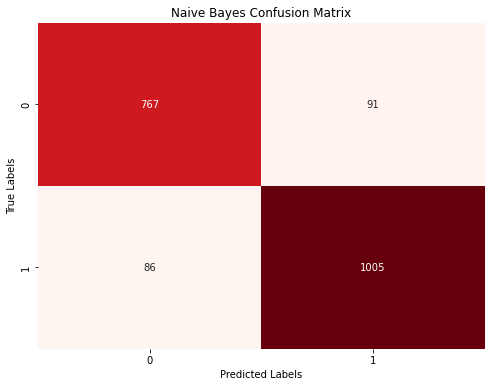

In [68]:
fakenews_nb_cm = confusion_matrix(fakenews_y_test, fakenews_y_pred_nb)
plot_confusion_matrix(fakenews_nb_cm, "Naive Bayes Confusion Matrix", cmap="Reds")

## 3. Model Training and Comparison for Energy Consumption

In [69]:
# Model 1: Decision Tree
energy_dt = DecisionTreeRegressor(random_state=42)
energy_dt.fit(energy_X_train, energy_y_train)
energy_dt_pred = energy_dt.predict(energy_X_test)

In [70]:
# Define bin edges (you can adjust this based on your data)
bins = [ 0.1]  # Example bin edges

# Discretize the true values and predictions based on the bins
energy_y_test_b = np.digitize(energy_y_test, bins)
energy_dt_pred_b = np.digitize(energy_dt_pred, bins)

In [71]:
# Evaluation
print("\nEnergy Consumption Accuracy:")
print("Decision Tree Accuracy :", accuracy_score(energy_y_test_b, energy_dt_pred_b))


Energy Consumption Accuracy:
Decision Tree Accuracy : 0.9712753734201456


In [72]:
# Evaluate performance
print('Decision Tree Classifier:')
print(classification_report(energy_y_test_b, energy_dt_pred_b))

Decision Tree Classifier:
              precision    recall  f1-score   support

           0       0.77      0.72      0.74       151
           1       0.98      0.99      0.98      2460

    accuracy                           0.97      2611
   macro avg       0.88      0.85      0.86      2611
weighted avg       0.97      0.97      0.97      2611



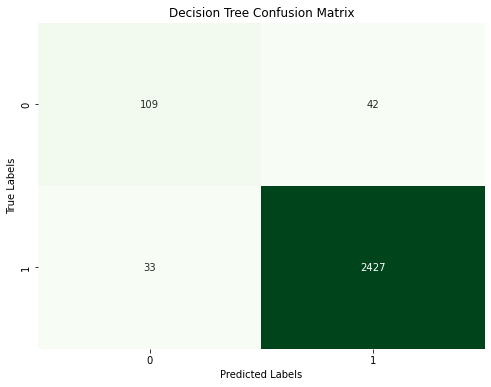

In [73]:
# Confusion matrices
dt_cm = confusion_matrix(energy_y_test_b, energy_dt_pred_b)
plot_confusion_matrix(dt_cm, "Decision Tree Confusion Matrix", cmap="Greens")

In [74]:
# Model 2: K-Nearest Neighbors Regressor
energy_knn = KNeighborsRegressor(n_neighbors=5)
energy_knn.fit(energy_X_train, energy_y_train)
energy_knn_pred = energy_knn.predict(energy_X_test)

In [75]:
# Define bin edges (you can adjust this based on your data)
bins = [ 0.1]  # Example bin edges

# Discretize the true values and predictions based on the bins
energy_y_test_b = np.digitize(energy_y_test, bins)
energy_knn_pred_b = np.digitize(energy_knn_pred, bins)

In [76]:
# Evaluation
print("\nPatients Data Accuracy:")
print("K-Nearest Neighbors :", accuracy_score(energy_y_test_b, energy_knn_pred_b))


Patients Data Accuracy:
K-Nearest Neighbors : 0.9222520107238605


In [77]:
print("\nClassification Report for K-Nearest Neighbors Regressor:")
print(classification_report(energy_y_test_b, energy_knn_pred_b))


Classification Report for K-Nearest Neighbors Regressor:
              precision    recall  f1-score   support

           0       0.21      0.13      0.16       151
           1       0.95      0.97      0.96      2460

    accuracy                           0.92      2611
   macro avg       0.58      0.55      0.56      2611
weighted avg       0.91      0.92      0.91      2611



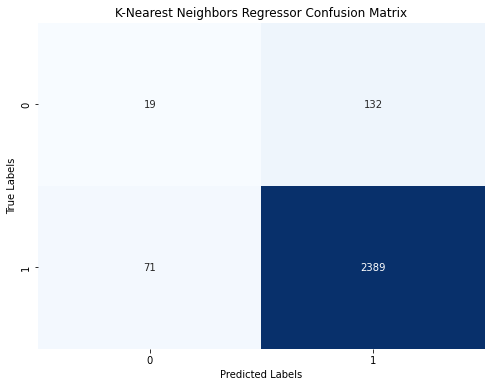

In [78]:
# Confusion matrices
energy_knn_cm = confusion_matrix(energy_y_test_b, energy_knn_pred_b)
plot_confusion_matrix(energy_knn_cm, "K-Nearest Neighbors Regressor Confusion Matrix", cmap="Blues")

# Comparison for models 

In [79]:
# List of datasets, predictions, and ground truth
datasets = [
    ("Hotel Bookings Dataset", [hotel_rf_pred, hotel_logreg_pred, hotel_svc_pred], [hotel_y_test, hotel_y_test, hotel_y_test]),
    ("Fake News Dataset", [fakenews_y_pred_kf, fakenews_y_pred_nb], [fakenews_y1_test, fakenews_y_test]),
    ("Energy Consumption Dataset", [energy_dt_pred_b, energy_knn_pred_b], [energy_y_test_b, energy_y_test_b])
]

models = [
    ["Random Forest", "Logistic Regression", "SVM"],
    ["K-Fold Validation", "Naive Bayes"],
    ["Decision Tree", "K-Nearest Neighbors"]
]

# Initialize a dictionary to store metrics for all models
metrics_dict = {
    "Model": [],
    "Dataset": [],
    "Accuracy Score": [],
}

# Iterate through datasets and models to calculate metrics
for dataset_idx, (dataset_name, preds, y_tests) in enumerate(datasets):
    for model_idx, (model_name, y_pred, y_test) in enumerate(zip(models[dataset_idx], preds, y_tests)):
        # Metrics Calculation
        accsc = accuracy_score(y_test, y_pred)
        
        # Append to metrics dictionary
        metrics_dict["Model"].append(model_name)
        metrics_dict["Dataset"].append(dataset_name)
        metrics_dict["Accuracy Score"].append(accsc)

# Convert the metrics dictionary to a DataFrame for Acc
print("Model wise Accuracy Score")
pd.DataFrame(metrics_dict)

Model wise Accuracy Score


,Model,Dataset,Accuracy Score
0,Random Forest,Hotel Bookings Dataset,0.999791
1,Logistic Regression,Hotel Bookings Dataset,0.719849
2,SVM,Hotel Bookings Dataset,0.624058
3,K-Fold Validation,Fake News Dataset,0.961499
4,Naive Bayes,Fake News Dataset,0.909184
5,Decision Tree,Energy Consumption Dataset,0.971275
6,K-Nearest Neighbors,Energy Consumption Dataset,0.922252


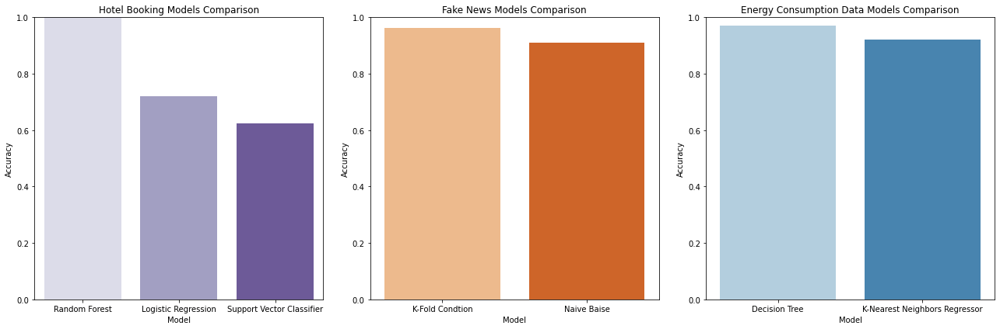

In [80]:
# Comparison for Hotel Bookings Models
hotel_models = [ 'Random Forest', 'Logistic Regression', 'Support Vector Classifier']
hotel_accuracies = [
    accuracy_score(hotel_y_test, hotel_rf_pred),
    accuracy_score(hotel_y_test, hotel_logreg_pred),
    accuracy_score(hotel_y_test, hotel_svc_pred)
]

# Comparison for Fake News Models
fakenews_models = [ 'K-Fold Condtion', 'Naive Baise']
fakenews_accuracies = [
    accuracy_score(fakenews_y1_test, fakenews_y_pred_kf),
    accuracy_score(fakenews_y_test, fakenews_y_pred_nb)
]

# Comparison for Energy Consumption Models
energy_models = [ 'Decision Tree', 'K-Nearest Neighbors Regressor']
energy_accuracies = [
    accuracy_score(energy_y_test_b, energy_dt_pred_b),
    accuracy_score(energy_y_test_b, energy_knn_pred_b)
]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.barplot(x=hotel_models, y=hotel_accuracies, ax=axes[0], palette='Purples')
axes[0].set_title('Hotel Booking Models Comparison')
axes[0].set_ylim(0, 1)
axes[0].set_xlabel('Model')
axes[0].set_ylabel('Accuracy')
sns.barplot(x=fakenews_models, y=fakenews_accuracies, ax=axes[1], palette='Oranges')
axes[1].set_title('Fake News Models Comparison')
axes[1].set_ylim(0, 1)
axes[1].set_xlabel('Model')
axes[1].set_ylabel('Accuracy')
sns.barplot(x=energy_models, y=energy_accuracies, ax=axes[2], palette='Blues')
axes[2].set_title('Energy Consumption Data Models Comparison')
axes[2].set_ylim(0, 1)
axes[2].set_xlabel('Model')
axes[2].set_ylabel('Accuracy')
plt.tight_layout()
plt.show()

# Performance Metrics: RMSE, RSS, Sensitivity/Specificity, and MAPE for Model Evaluation

In [81]:
# Function to calculate Root Mean Square Error (RMSE)
def calculate_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Function to calculate Residual Sum of Squares (RSS)
def calculate_r2(y_true, y_pred):
    return r2_score(y_true, y_pred)
    
# Function to calculate Residual Sum of Squares (RSS)
def calculate_rss(y_true, y_pred):
    return np.sum(np.square(y_true - y_pred))

# Function to calculate Sensitivity and Specificity
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    sensitivity = cm[1, 1] / (cm[1, 1] + cm[1, 0])  # True Positive / (True Positive + False Negative)
    specificity = cm[0, 0] / (cm[0, 0] + cm[0, 1])  # True Negative / (True Negative + False Positive)
    return sensitivity, specificity

# Function to calculate Mean Absolute Percentage Error (MAPE)
def calculate_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    if np.isnan(np.mean(np.abs((y_true - y_pred) / y_true)) * 100):
        return 0.001
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [82]:
# Generic function to calculate and print all metrics
def print_regression_metrics(model_name, y_true, y_pred):
    print("Regression Metrics of", model_name)
    print("-------------------")
    
    # Calculate sensitivity and specificity (for classification tasks)
    sensitivity, specificity = calculate_sensitivity_specificity(y_true, np.round(y_pred))
    
    print("Root Mean Square Error (RMSE):", calculate_rmse(y_true, y_pred))
    print("Residual Sum of Squares (RSS):", calculate_rss(y_true, y_pred))
    print("R2 Score:", calculate_r2(y_true, y_pred))
    print("Sensitivity:", sensitivity)
    print("Specificity:", specificity)
    print("Mean Absolute Percentage Error (MAPE):", calculate_mape(y_true, y_pred))


## 1. Hotel Booking Dataset

### 1.1 Random Forest Model

In [83]:
# Print results of Random Forest
print_regression_metrics("Random Forest Model (Hotel Booking DS)",hotel_y_test,hotel_rf_pred)

Regression Metrics of Random Forest Model (Hotel Booking DS)
-------------------
Root Mean Square Error (RMSE): 0.014469977004330817
Residual Sum of Squares (RSS): 2
R2 Score: 0.9991075378991571
Sensitivity: 0.999443052074631
Specificity: 1.0
Mean Absolute Percentage Error (MAPE): 0.001


### 1.2 Logistic Regression Model

In [84]:
# Print results of Logistic Regression
print_regression_metrics("Logistic Regression Model (Hotel Booking DS)",hotel_y_test,hotel_logreg_pred)

Regression Metrics of Logistic Regression Model (Hotel Booking DS)
-------------------
Root Mean Square Error (RMSE): 0.5292926919662166
Residual Sum of Squares (RSS): 2676
R2 Score: -0.19411429092778887
Sensitivity: 0.46588693957115007
Specificity: 0.8728401274953866
Mean Absolute Percentage Error (MAPE): 0.001


### 1.3 Support Vector Classifier Model

In [85]:
# Print results of Support Vector Classifier
print_regression_metrics("Support Vector Classifier Model (Hotel Booking DS)",hotel_y_test,hotel_svc_pred)

Regression Metrics of Support Vector Classifier Model (Hotel Booking DS)
-------------------
Root Mean Square Error (RMSE): 0.6131412651708221
Residual Sum of Squares (RSS): 3591
R2 Score: -0.6024157020634116
Sensitivity: 0.0
Specificity: 1.0
Mean Absolute Percentage Error (MAPE): 0.001


## 2. Fake News Dataset

### 2.1 K-Fold Condtion Model

In [86]:
# Print results of K-Fold Condtion Model
print_regression_metrics("K-Fold Condtion Model (Fake News DS)",fakenews_y1_test,fakenews_y_pred_kf)

Regression Metrics of K-Fold Condtion Model (Fake News DS)
-------------------
Root Mean Square Error (RMSE): 0.19621679
Residual Sum of Squares (RSS): 75.0
R2 Score: 0.8437018570591066
Sensitivity: 0.9487179487179487
Specificity: 0.977803738317757
Mean Absolute Percentage Error (MAPE): 0.001


### 2.2 Naive Baise Model

In [87]:
# Print results of Naive Baise Model
print_regression_metrics("Naive Baise Model (Fake News DS)",fakenews_y_test,fakenews_y_pred_nb)

Regression Metrics of Naive Baise Model (Fake News DS)
-------------------
Root Mean Square Error (RMSE): 0.30135660433427547
Residual Sum of Squares (RSS): 177
R2 Score: 0.6314698134129849
Sensitivity: 0.921173235563703
Specificity: 0.8939393939393939
Mean Absolute Percentage Error (MAPE): 0.001


## 3. Energy Consumption Dataset

In [88]:
# Comparison for Energy Consumption Models
energy_models = [ 'Decision Tree', 'K-Nearest Neighbors Regressor']
energy_accuracies = [
    accuracy_score(energy_y_test_b, energy_dt_pred_b),
    accuracy_score(energy_y_test_b, energy_knn_pred_b)
]

### 3.1 Decision Tree Model

In [89]:
# Print results of Decision Tree Model
print_regression_metrics("Decision Tree Model (Energy Consumption DS)",energy_y_test_b,energy_dt_pred_b)

Regression Metrics of Decision Tree Model (Energy Consumption DS)
-------------------
Root Mean Square Error (RMSE): 0.16948341092819222
Residual Sum of Squares (RSS): 75
R2 Score: 0.472823453400097
Sensitivity: 0.9865853658536585
Specificity: 0.7218543046357616
Mean Absolute Percentage Error (MAPE): 0.001


### 3.2 K-Nearest Neighbors Regressor

In [90]:
# Print results of K-Nearest Neighbors Regressor
print_regression_metrics("K-Nearest Neighbors Regressor Model (Energy Consumption DS)",energy_y_test_b,energy_knn_pred_b)

Regression Metrics of K-Nearest Neighbors Regressor Model (Energy Consumption DS)
-------------------
Root Mean Square Error (RMSE): 0.27883326429273
Residual Sum of Squares (RSS): 203
R2 Score: -0.4268911861304041
Sensitivity: 0.9711382113821139
Specificity: 0.12582781456953643
Mean Absolute Percentage Error (MAPE): 0.001


In [91]:
import pandas as pd
from sklearn.metrics import r2_score, cohen_kappa_score, f1_score

# Assuming you have predefined functions for RMSE and RSS calculations
def calculate_rmse(y_true, y_pred):
    return ((y_true - y_pred) ** 2).mean() ** 0.5

def calculate_rss(y_true, y_pred):
    return ((y_true - y_pred) ** 2).sum()

def calculate_sensitivity_specificity(y_true, y_pred):
    # Replace with actual implementation
    pass

# Initialize a dictionary to store metrics for all models
metrics_dict = {
    "Model": [],
    "Dataset": [],
    "R2": [],
    "Cohen's Kappa": [],
    "RMSE": [],
    "RSS": [],
    "Sensitivity": [],
    "Specificity": [],
    "F-Measure": [],
}

# List of datasets, predictions, and ground truth
datasets = [
    ("Hotel Bookings Dataset", [hotel_rf_pred, hotel_logreg_pred, hotel_svc_pred], [hotel_y_test, hotel_y_test, hotel_y_test]),
    ("Fake News Dataset", [fakenews_y_pred_kf, fakenews_y_pred_nb], [fakenews_y1_test, fakenews_y_test]),
    ("Energy Consumption Dataset", [energy_dt_pred_b, energy_knn_pred_b], [energy_y_test_b, energy_y_test_b])
]

models = [
    ["Random Forest", "Logistic Regression", "SVM"],
    ["K-Fold Validation", "Naive Bayes"],
    ["Decision Tree", "K-Nearest Neighbors"]
]
# Function to calculate Root Mean Square Error (RMSE)
def calculate_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Function to calculate Residual Sum of Squares (RSS)
def calculate_r2(y_true, y_pred):
    return r2_score(y_true, y_pred)
    
# Function to calculate Residual Sum of Squares (RSS)
def calculate_rss(y_true, y_pred):
    return np.sum(np.square(y_true - y_pred))

# Function to calculate Sensitivity and Specificity
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    sensitivity = cm[1, 1] / (cm[1, 1] + cm[1, 0])  # True Positive / (True Positive + False Negative)
    specificity = cm[0, 0] / (cm[0, 0] + cm[0, 1])  # True Negative / (True Negative + False Positive)
    return sensitivity, specificity

# Function to calculate Mean Absolute Percentage Error (MAPE)
def calculate_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    if np.isnan(np.mean(np.abs((y_true - y_pred) / y_true)) * 100):
        return 0.001
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
# Iterate through datasets and models to calculate metrics
for dataset_idx, (dataset_name, preds, y_tests) in enumerate(datasets):
    for model_idx, (model_name, y_pred, y_test) in enumerate(zip(models[dataset_idx], preds, y_tests)):
        # Metrics Calculation
        r2 = calculate_r2(y_test, y_pred)
        cohen_kappa = cohen_kappa_score(y_test, y_pred)
        rmse = calculate_rmse(y_test, y_pred)
        rss = calculate_rss(y_test, y_pred)
        sensitivity, specificity = calculate_sensitivity_specificity(y_test, np.round(y_pred))
        f_measure = f1_score(y_test, y_pred)
        
        # Append to metrics dictionary
        metrics_dict["Model"].append(model_name)
        metrics_dict["Dataset"].append(dataset_name)
        metrics_dict["R2"].append(r2)
        metrics_dict["Cohen's Kappa"].append(cohen_kappa)
        metrics_dict["RMSE"].append(rmse)
        metrics_dict["RSS"].append(rss)
        metrics_dict["Sensitivity"].append(sensitivity)
        metrics_dict["Specificity"].append(specificity)
        metrics_dict["F-Measure"].append(f_measure)

# Convert the metrics dictionary to a DataFrame
print("Model wise R2, Cohen's Kappa, RMSE, RSS, Sensitivity/Specificity, and F-Measure Evaluation")
pd.DataFrame(metrics_dict)


Model wise R2, Cohen's Kappa, RMSE, RSS, Sensitivity/Specificity, and F-Measure Evaluation


,Model,Dataset,R2,Cohen's Kappa,RMSE,RSS,Sensitivity,Specificity,F-Measure
0,Random Forest,Hotel Bookings Dataset,0.999108,0.999554,0.014470,2.0,0.999443,1.000000,0.999721
1,Logistic Regression,Hotel Bookings Dataset,-0.194114,0.361971,0.529293,2676.0,0.465887,0.872840,0.555629
2,SVM,Hotel Bookings Dataset,-0.602416,0.000000,0.613141,3591.0,0.000000,1.000000,0.000000
3,K-Fold Validation,Fake News Dataset,0.843702,0.922214,0.196217,75.0,0.948718,0.977804,0.965068
4,Naive Bayes,Fake News Dataset,0.631470,0.815620,0.301357,177.0,0.921173,0.893939,0.919067
5,Decision Tree,Energy Consumption Dataset,0.472823,0.728826,0.169483,75.0,0.986585,0.721854,0.984784
6,K-Nearest Neighbors,Energy Consumption Dataset,-0.426891,0.119650,0.278833,203.0,0.971138,0.125828,0.959245
